# Generative Adversarial Networks

For this part of the assignment you implement two different types of generative adversarial networks. We will train the networks on a dataset of cat face images.

In [141]:
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [142]:
from gan.train import train

In [143]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# GAN loss functions

In this assignment you will implement two different types of GAN cost functions. You will first implement the loss from the [original GAN paper](https://arxiv.org/pdf/1406.2661.pdf). You will also implement the loss from [LS-GAN](https://arxiv.org/abs/1611.04076). 

### GAN loss

**TODO:** Implement the `discriminator_loss` and `generator_loss` functions in `gan/losses.py`.

The generator loss is given by:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: You should use the `torch.nn.functional.binary_cross_entropy_with_logits` function to compute the binary cross entropy loss since it is more numerically stable than using a softmax followed by BCE loss. The BCE loss is needed to compute the log probability of the true label given the logits output from the discriminator. Given a score $s\in\mathbb{R}$ and a label $y\in\{0, 1\}$, the binary cross entropy loss is

$$ bce(s, y) = -y * \log(s) - (1 - y) * \log(1 - s) $$


Instead of computing the expectation of $\log D(G(z))$, $\log D(x)$ and $\log \left(1-D(G(z))\right)$, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing.

In [144]:
from gan.losses import discriminator_loss, generator_loss

### Least Squares GAN loss

**TODO:** Implement the `ls_discriminator_loss` and `ls_generator_loss` functions in `gan/losses.py`.

We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alernative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`scores_real` and `scores_fake`).

In [145]:
from gan.losses import ls_discriminator_loss, ls_generator_loss

# GAN model architecture

**TODO:** Implement the `Discriminator` and `Generator` networks in `gan/models.py`.

We recommend the following architectures which are inspired by [DCGAN](https://arxiv.org/pdf/1511.06434.pdf):

**Discriminator:**

- convolutional layer with in_channels=3, out_channels=128, kernel=4, stride=2
- convolutional layer with in_channels=128, out_channels=256, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=256, out_channels=512, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=512, out_channels=1024, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=1024, out_channels=1, kernel=4, stride=1

Use padding = 1 (not 0) for all the convolutional layers.

Instead of Relu we LeakyReLu throughout the discriminator (we use a negative slope value of 0.2). You can use simply use relu as well.

The output of your discriminator should be a single value score corresponding to each input sample. See `torch.nn.LeakyReLU`.


**Generator:**

**Note:** In the generator, you will need to use transposed convolution (sometimes known as fractionally-strided convolution or deconvolution). This function is implemented in pytorch as `torch.nn.ConvTranspose2d`.

- transpose convolution with in_channels=NOISE_DIM, out_channels=1024, kernel=4, stride=1
- batch norm
- transpose convolution with in_channels=1024, out_channels=512, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=512, out_channels=256, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=256, out_channels=128, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=128, out_channels=3, kernel=4, stride=2

The output of the final layer of the generator network should have a `tanh` nonlinearity to output values between -1 and 1. The output should be a 3x64x64 tensor for each sample (equal dimensions to the images from the dataset).





In [146]:
from gan.models import Discriminator, Generator

# Data loading

The cat images we provide are RGB images with a resolution of 64x64. In order to prevent our discriminator from overfitting, we will need to perform some data augmentation.

**TODO:** Implement data augmentation by adding new transforms to the cell below. At the minimum, you should have a RandomCrop and a ColorJitter, but we encourage you to experiment with different augmentations to see how the performance of the GAN changes. See https://pytorch.org/vision/stable/transforms.html.


In [147]:
#!sh download_cat.sh

In [148]:
batch_size = 32
imsize = 64
cat_root = './cats'

cat_train = ImageFolder(root=cat_root, transform=transforms.Compose([
  transforms.ToTensor(),
    
  # Example use of RandomCrop:
  transforms.Resize(int(1.15 * imsize)),
  transforms.RandomCrop(imsize),
  transforms.ColorJitter(brightness=0.1, contrast=0.3, saturation=0.4, hue=0.05), #Color Jitter
  #transforms.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.9, 1.1), shear=10),
  transforms.GaussianBlur(kernel_size=3),
]))

cat_loader_train = DataLoader(cat_train, batch_size=batch_size, drop_last=True)

### Visualize dataset

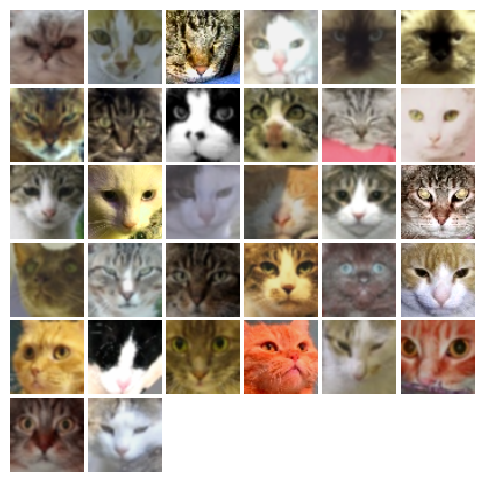

In [149]:
from gan.utils import show_images
imgs = next(cat_loader_train.__iter__())[0].numpy().squeeze()
#imgs = next(faces_loader_train.__iter__())[0].numpy().squeeze()
show_images(imgs, color=True)

# Training 


**TODO:** Fill in the training loop in `gan/train.py`.

In [150]:
NOISE_DIM = 100
NUM_EPOCHS = 50
learning_rate = 0.001

### Train GAN

In [151]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [152]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate, betas = (0.5, 0.999))

EPOCH:  1
Iter: 0, D: 1.411, G:1.826


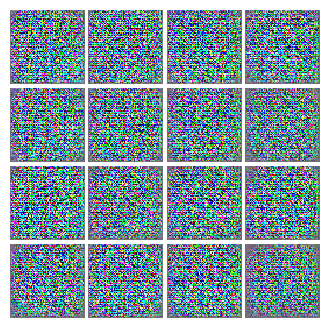


EPOCH:  2
EPOCH:  3
Iter: 1000, D: 1.084, G:1.9


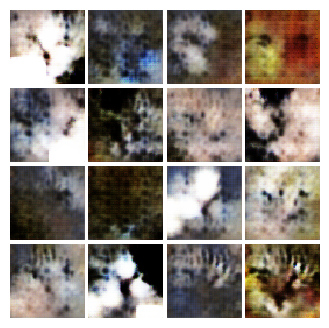


EPOCH:  4
EPOCH:  5
Iter: 2000, D: 0.2104, G:2.723


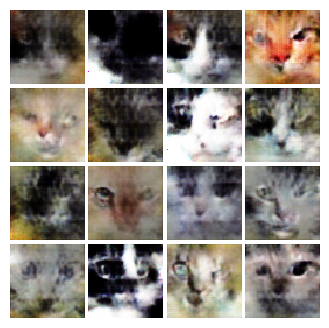


EPOCH:  6
EPOCH:  7
Iter: 3000, D: 0.7116, G:4.115


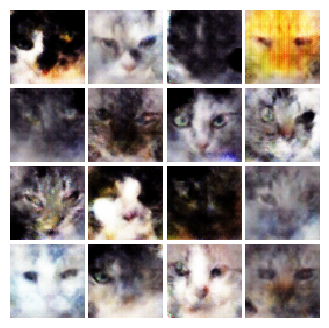


EPOCH:  8
EPOCH:  9
Iter: 4000, D: 0.1422, G:3.512


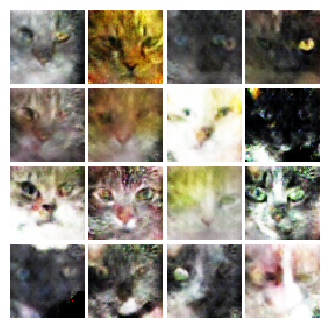


EPOCH:  10
EPOCH:  11
Iter: 5000, D: 0.3334, G:4.669


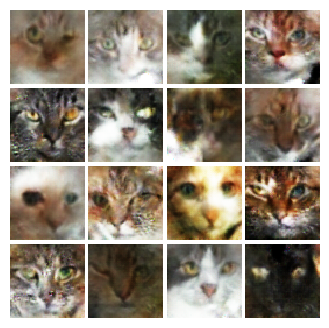


EPOCH:  12
EPOCH:  13
Iter: 6000, D: 0.2245, G:4.344


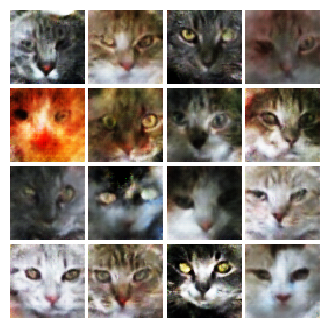


EPOCH:  14
EPOCH:  15
Iter: 7000, D: 0.2126, G:3.281


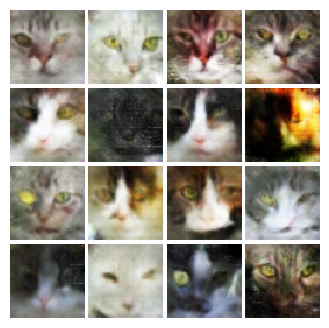


EPOCH:  16
EPOCH:  17
Iter: 8000, D: 0.1318, G:3.838


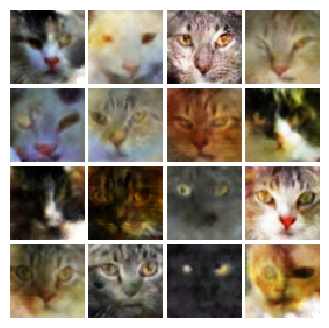


EPOCH:  18
EPOCH:  19
Iter: 9000, D: 0.1326, G:3.812


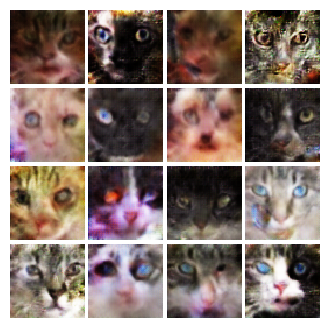


EPOCH:  20
EPOCH:  21
Iter: 10000, D: 0.405, G:3.708


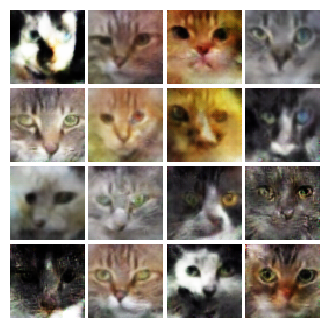


EPOCH:  22
EPOCH:  23
Iter: 11000, D: 0.214, G:3.71


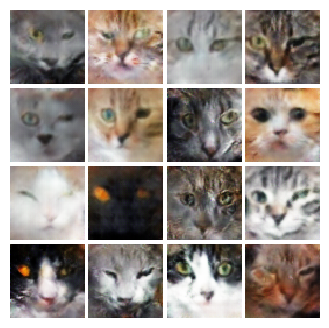


EPOCH:  24
EPOCH:  25
Iter: 12000, D: 0.1055, G:3.702


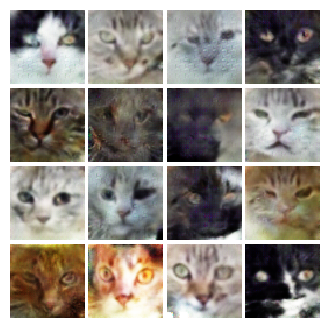


EPOCH:  26
EPOCH:  27
Iter: 13000, D: 1.152, G:2.125


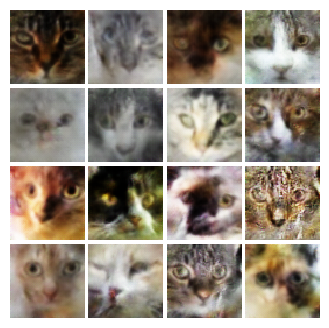


EPOCH:  28
EPOCH:  29
Iter: 14000, D: 0.7767, G:1.865


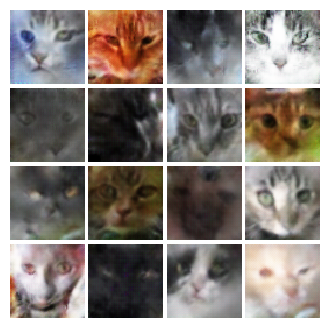


EPOCH:  30
EPOCH:  31
Iter: 15000, D: 0.1409, G:3.437


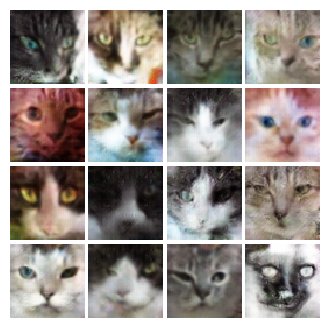


EPOCH:  32
EPOCH:  33
Iter: 16000, D: 0.01472, G:5.642


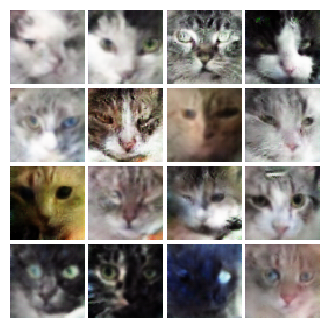


EPOCH:  34
EPOCH:  35
Iter: 17000, D: 0.07153, G:3.647


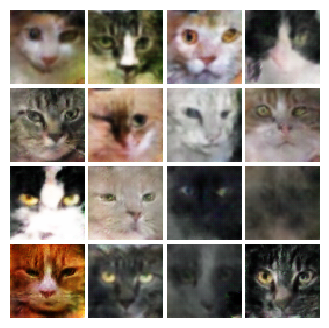


EPOCH:  36
EPOCH:  37
Iter: 18000, D: 0.3317, G:5.291


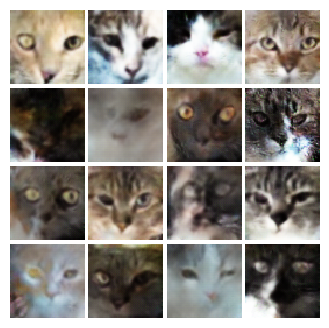


EPOCH:  38
EPOCH:  39
Iter: 19000, D: 0.3907, G:3.17


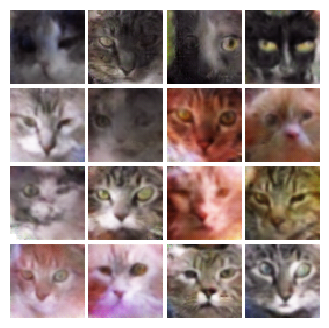


EPOCH:  40
EPOCH:  41
Iter: 20000, D: 0.1203, G:3.223


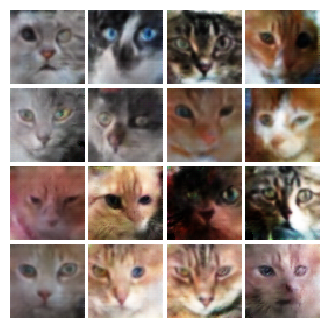


EPOCH:  42
EPOCH:  43
Iter: 21000, D: 0.03874, G:4.296


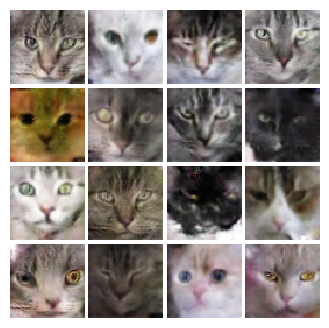


EPOCH:  44
EPOCH:  45
Iter: 22000, D: 0.06929, G:4.527


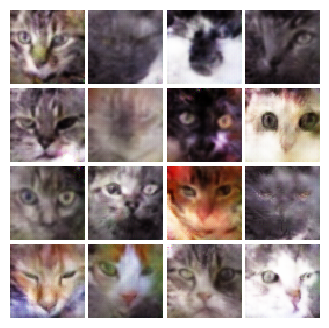


EPOCH:  46
EPOCH:  47
Iter: 23000, D: 0.02522, G:4.319


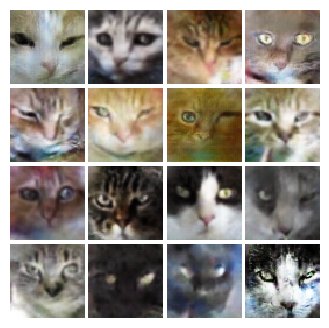


EPOCH:  48
EPOCH:  49
Iter: 24000, D: 0.03367, G:4.853


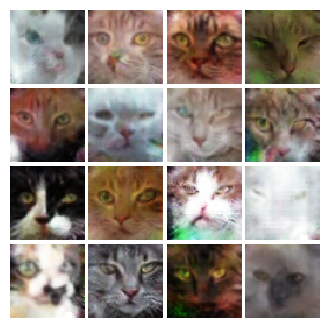


EPOCH:  50


In [153]:
# original gan
train(D, G, D_optimizer, G_optimizer, discriminator_loss, 
          generator_loss, num_epochs=NUM_EPOCHS, show_every=1000,
          batch_size=batch_size, train_loader=cat_loader_train, device=device)


### Train LS-GAN

In [154]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [155]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=1e-3, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=1e-3, betas = (0.5, 0.999))

EPOCH:  1
Iter: 0, D: 0.4397, G:3.352


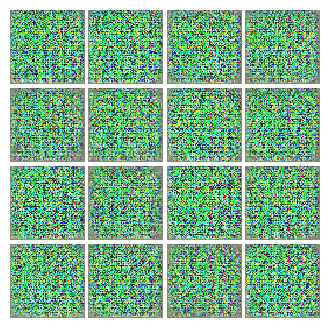


EPOCH:  2
EPOCH:  3
Iter: 1000, D: 0.2208, G:0.4892


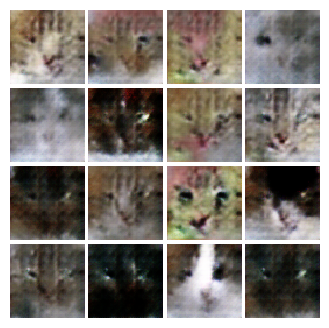


EPOCH:  4
EPOCH:  5
Iter: 2000, D: 0.119, G:0.5479


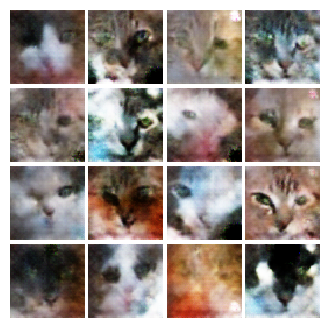


EPOCH:  6
EPOCH:  7
Iter: 3000, D: 0.2956, G:0.6481


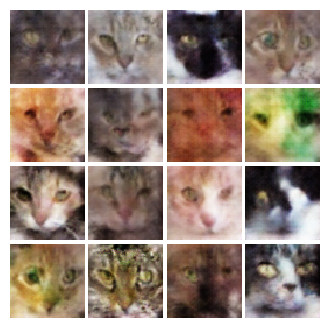


EPOCH:  8
EPOCH:  9
Iter: 4000, D: 0.06443, G:0.5199


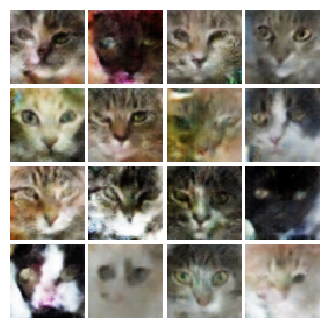


EPOCH:  10
EPOCH:  11
Iter: 5000, D: 0.1312, G:0.6708


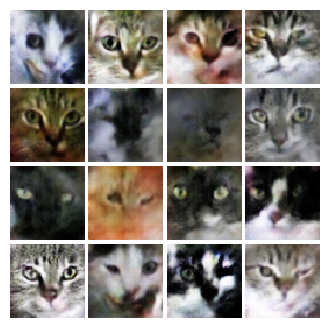


EPOCH:  12
EPOCH:  13
Iter: 6000, D: 0.06006, G:0.5537


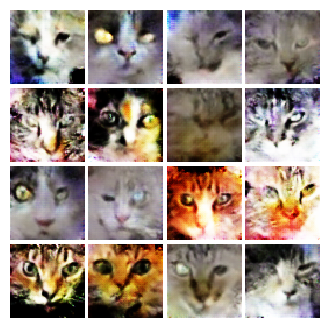


EPOCH:  14
EPOCH:  15
Iter: 7000, D: 0.03187, G:0.5379


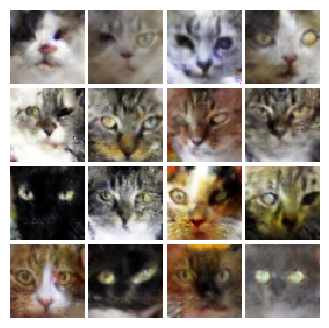


EPOCH:  16
EPOCH:  17
Iter: 8000, D: 0.05316, G:0.5273


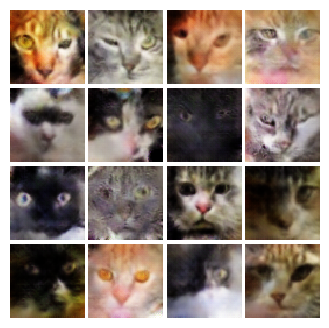


EPOCH:  18
EPOCH:  19
Iter: 9000, D: 0.04248, G:0.5299


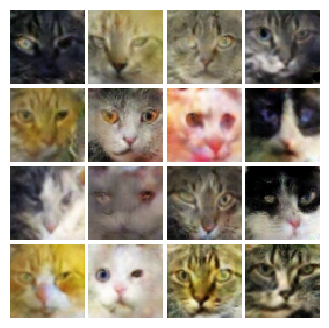


EPOCH:  20
EPOCH:  21
Iter: 10000, D: 0.02604, G:0.5293


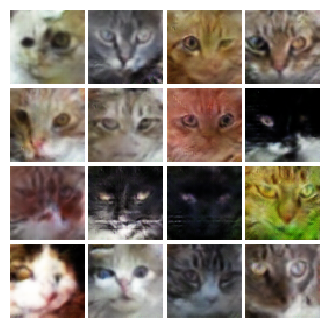


EPOCH:  22
EPOCH:  23
Iter: 11000, D: 0.03672, G:0.5771


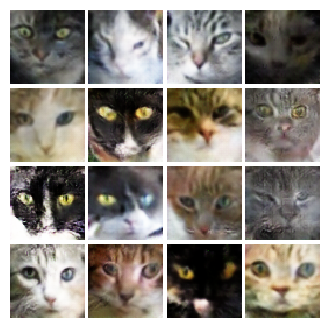


EPOCH:  24
EPOCH:  25
Iter: 12000, D: 0.03023, G:0.5712


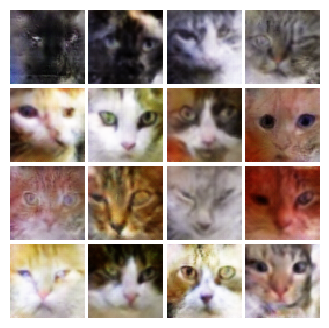


EPOCH:  26
EPOCH:  27
Iter: 13000, D: 0.05176, G:0.4469


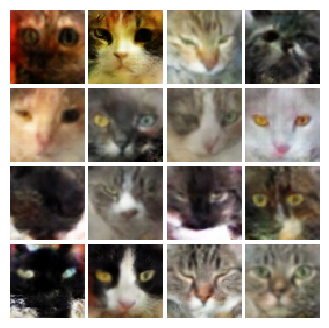


EPOCH:  28
EPOCH:  29
Iter: 14000, D: 0.01341, G:0.585


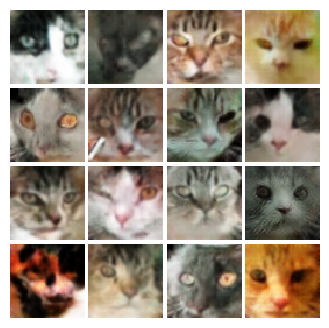


EPOCH:  30
EPOCH:  31
Iter: 15000, D: 0.01686, G:0.4873


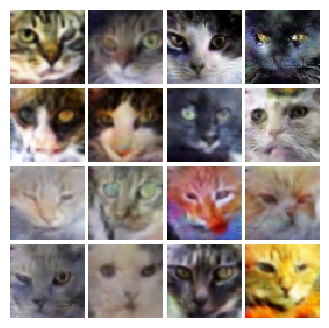


EPOCH:  32
EPOCH:  33
Iter: 16000, D: 0.0354, G:0.6495


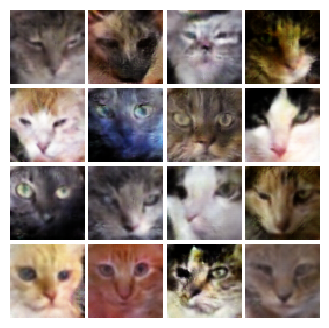


EPOCH:  34
EPOCH:  35
Iter: 17000, D: 0.0381, G:0.4843


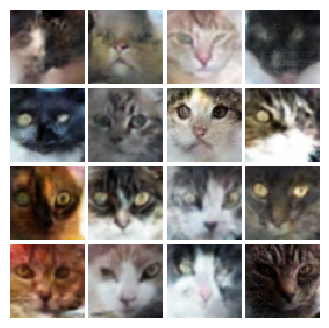


EPOCH:  36
EPOCH:  37
Iter: 18000, D: 0.05416, G:0.6015


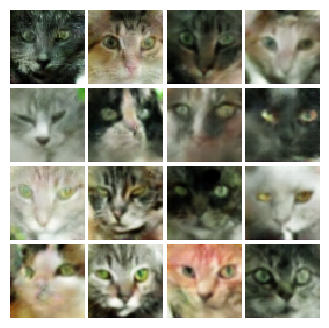


EPOCH:  38
EPOCH:  39
Iter: 19000, D: 0.01946, G:0.5489


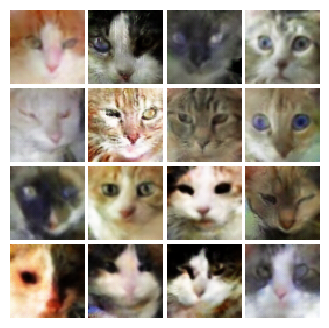


EPOCH:  40
EPOCH:  41
Iter: 20000, D: 0.08939, G:0.5953


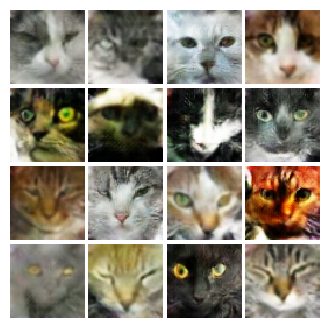


EPOCH:  42
EPOCH:  43
Iter: 21000, D: 0.1304, G:0.3094


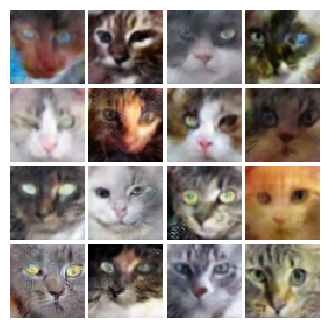


EPOCH:  44
EPOCH:  45
Iter: 22000, D: 0.01854, G:0.597


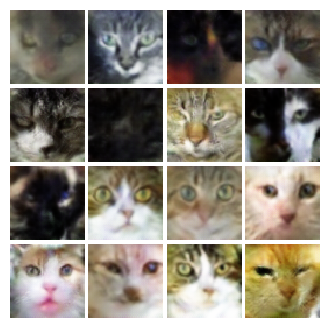


EPOCH:  46
EPOCH:  47
Iter: 23000, D: 0.0732, G:0.5234


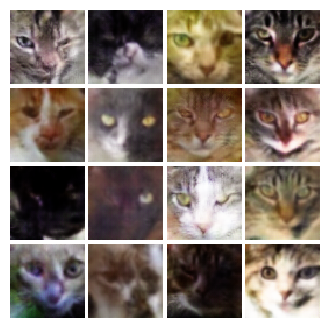


EPOCH:  48
EPOCH:  49
Iter: 24000, D: 0.03709, G:0.5959


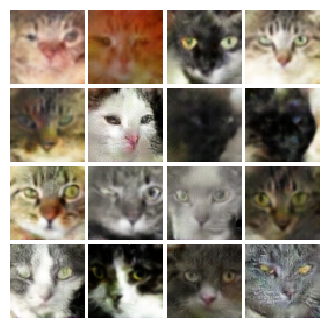


EPOCH:  50


In [156]:
# ls-gan
train(D, G, D_optimizer, G_optimizer, ls_discriminator_loss, 
          ls_generator_loss, num_epochs=NUM_EPOCHS, show_every=1000,
          batch_size=batch_size, train_loader=cat_loader_train, device=device)

**Extra Credit 1: Train Wasserstein GAN**

In [157]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [160]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=5e-4, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=5e-4, betas = (0.5, 0.999))

EPOCH:  1
Iter: 0, D: -2.052e+04, G:106.3


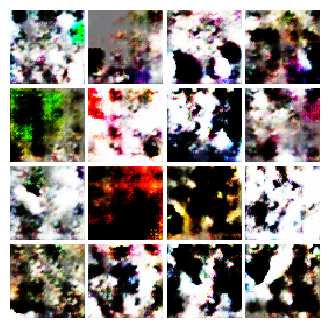


EPOCH:  2
EPOCH:  3
Iter: 1000, D: -3.296e+04, G:-409.3


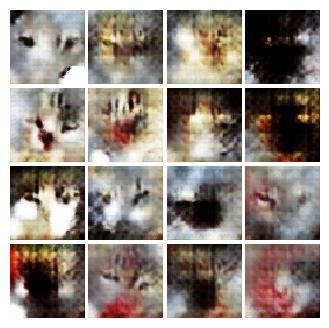


EPOCH:  4
EPOCH:  5
Iter: 2000, D: -5.292e+04, G:-1.935e+03


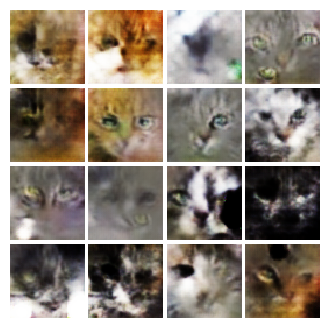


EPOCH:  6
EPOCH:  7
Iter: 3000, D: -7.934e+04, G:-3.982e+03


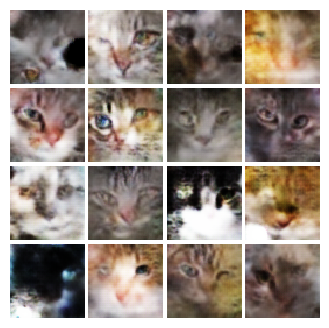


EPOCH:  8
EPOCH:  9
Iter: 4000, D: -1.255e+05, G:-3.192e+03


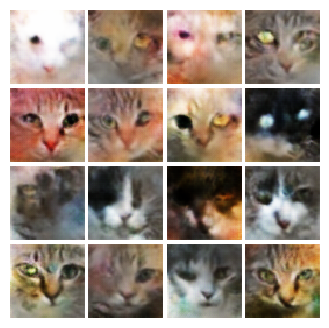


EPOCH:  10
EPOCH:  11
Iter: 5000, D: -1.808e+05, G:-3.897e+03


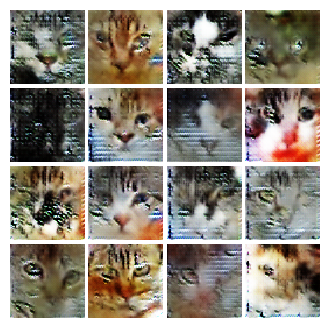


EPOCH:  12
EPOCH:  13
Iter: 6000, D: -2.364e+05, G:-7.127e+03


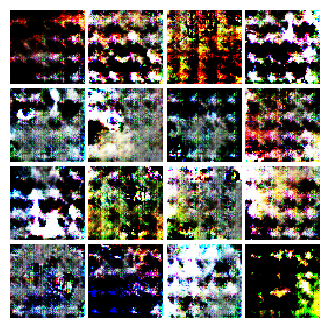


EPOCH:  14
EPOCH:  15
Iter: 7000, D: -1.543e+05, G:-1.778e+04


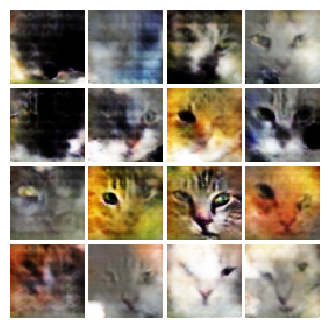


EPOCH:  16
EPOCH:  17
Iter: 8000, D: -3.363e+05, G:-1.204e+04


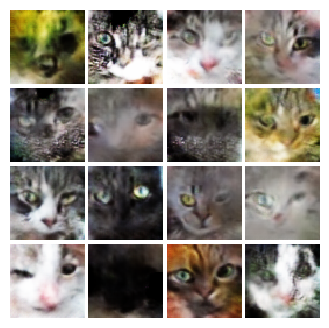


EPOCH:  18
EPOCH:  19
Iter: 9000, D: -4.133e+05, G:-1.527e+04


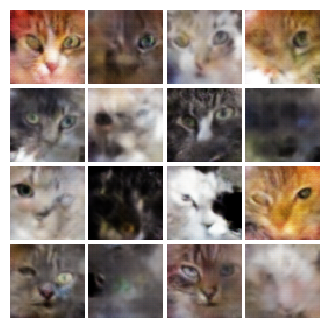


EPOCH:  20
EPOCH:  21
Iter: 10000, D: -5.032e+05, G:-1.873e+04


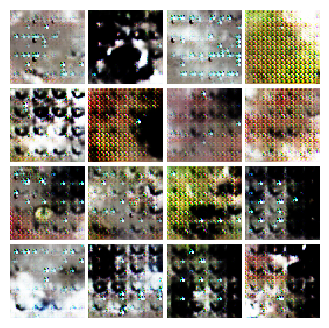


EPOCH:  22
EPOCH:  23
Iter: 11000, D: -5.844e+05, G:-2.068e+04


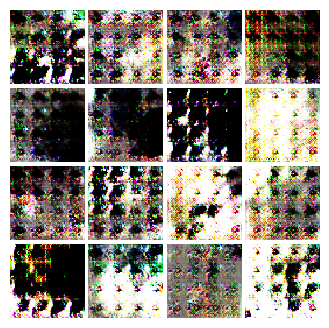


EPOCH:  24
EPOCH:  25
Iter: 12000, D: -6.722e+05, G:-2.268e+04


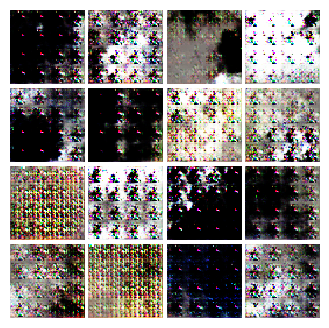


EPOCH:  26
EPOCH:  27
Iter: 13000, D: -7.614e+05, G:-2.606e+04


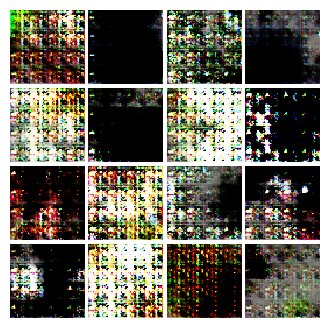


EPOCH:  28
EPOCH:  29
Iter: 14000, D: -8.602e+05, G:-2.897e+04


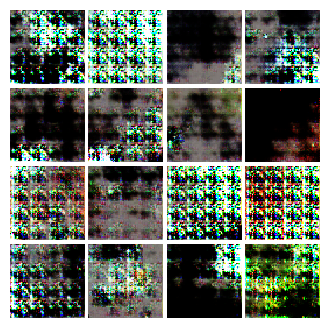


EPOCH:  30
EPOCH:  31
Iter: 15000, D: -9.616e+05, G:-3.194e+04


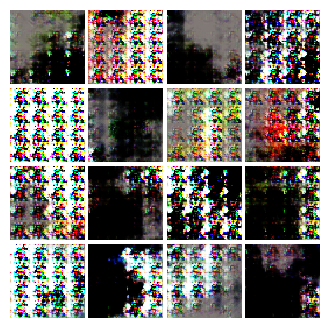


EPOCH:  32
EPOCH:  33
Iter: 16000, D: -1.071e+06, G:-3.406e+04


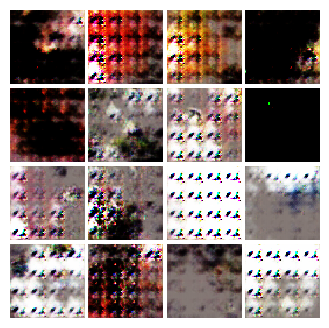


EPOCH:  34
EPOCH:  35
Iter: 17000, D: -1.162e+06, G:-3.24e+04


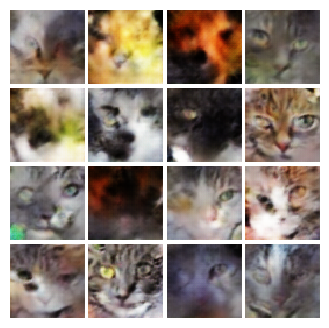


EPOCH:  36
EPOCH:  37
Iter: 18000, D: -1.203e+06, G:-5.424e+04


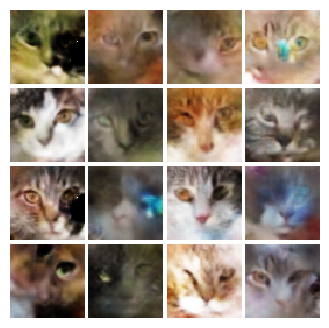


EPOCH:  38
EPOCH:  39
Iter: 19000, D: -1.247e+06, G:-8.067e+04


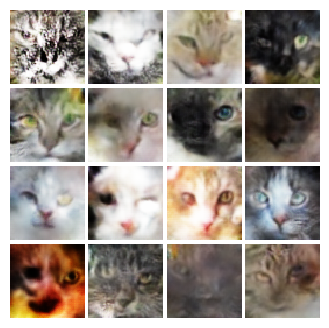


EPOCH:  40


In [161]:
# Wassertein-gan
from gan.losses import wass_discriminator_loss, wass_generator_loss
train(D, G, D_optimizer, G_optimizer, wass_discriminator_loss, 
          wass_generator_loss, num_epochs=40, show_every=1000,
          batch_size=batch_size, train_loader=cat_loader_train, device=device)

**Extra Credit 2: Different Dataset - Celeb Faces**

In [192]:
batch_size = 128
imsize = 64
faces_root = './celeb'
faces_train = ImageFolder(root=faces_root, transform=transforms.Compose([
   transforms.ToTensor(),
    
   # Example use of RandomCrop:
    transforms.Resize(int(1.1 * imsize)),
    transforms.RandomCrop(imsize),
    transforms.ColorJitter(brightness=0.1, contrast=0.3, saturation=0.4, hue=0.05),
    transforms.GaussianBlur(kernel_size=5)
 ]))

faces_loader_train = DataLoader(faces_train, batch_size=batch_size, drop_last=True)

**Visualize this Dataset**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


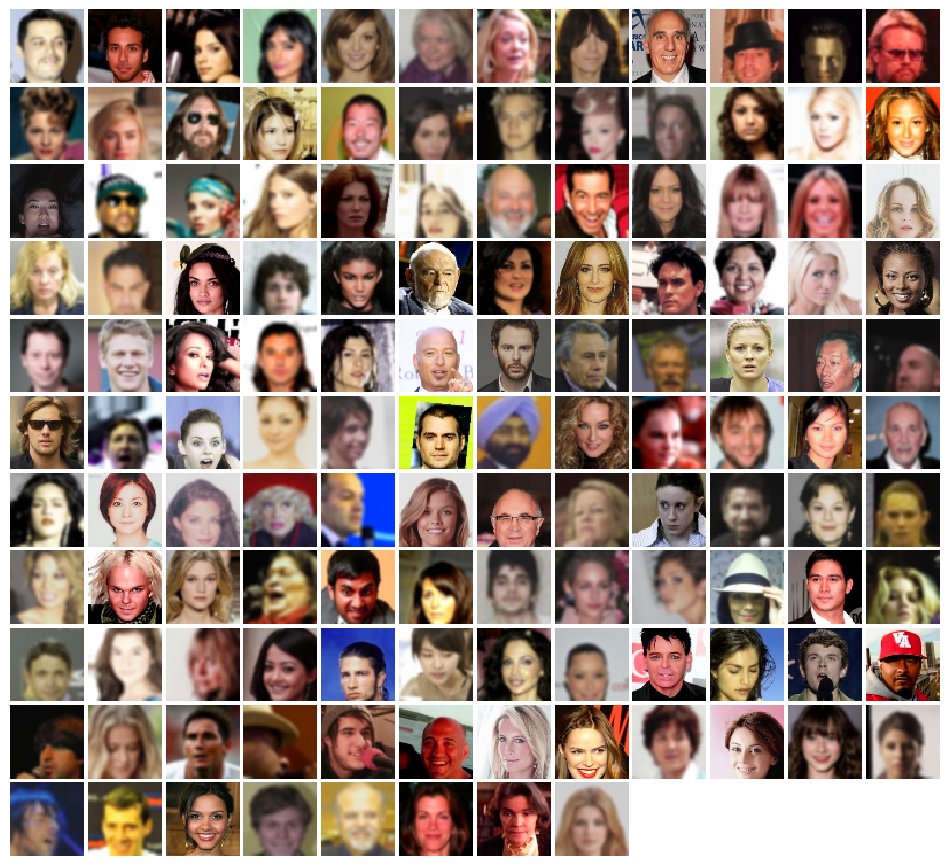

In [193]:
from gan.utils import show_images
imgs = next(faces_loader_train.__iter__())[0].numpy().squeeze()
show_images(imgs, color=True)

**Train with LS-GAN**

In [194]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [195]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=1e-4, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=1e-4, betas = (0.5, 0.999))

EPOCH:  1
Iter: 0, D: 0.4907, G:0.1681


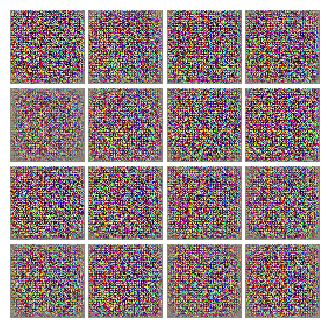


EPOCH:  2
EPOCH:  3
Iter: 1000, D: 0.08477, G:0.2828


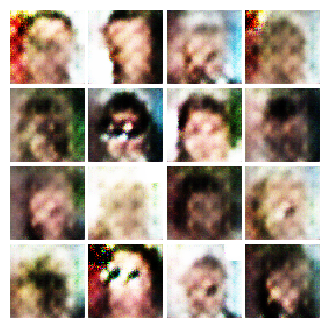


EPOCH:  4
EPOCH:  5
EPOCH:  6
Iter: 2000, D: 0.1882, G:0.1957


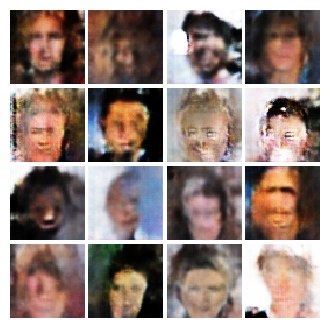


EPOCH:  7
EPOCH:  8
EPOCH:  9
Iter: 3000, D: 0.07842, G:0.4712


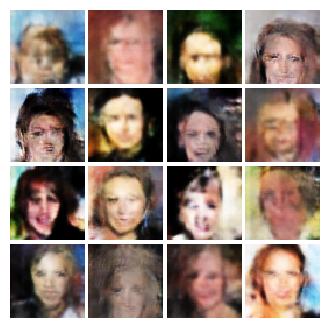


EPOCH:  10
EPOCH:  11
Iter: 4000, D: 0.03117, G:0.4129


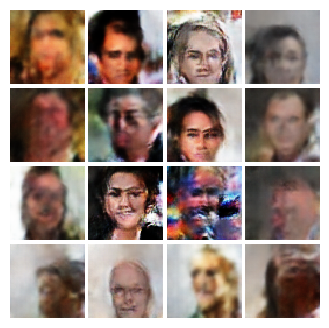


EPOCH:  12
EPOCH:  13
EPOCH:  14
Iter: 5000, D: 0.03221, G:0.5459


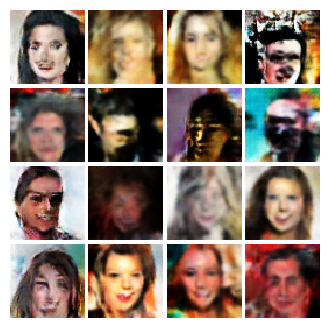


EPOCH:  15
EPOCH:  16
EPOCH:  17
Iter: 6000, D: 0.03598, G:0.5824


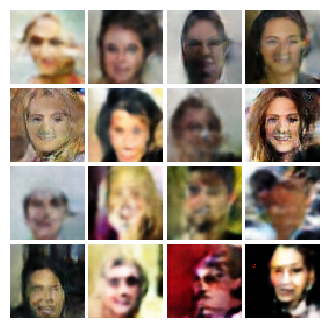


EPOCH:  18
EPOCH:  19
EPOCH:  20
Iter: 7000, D: 0.02141, G:0.5557


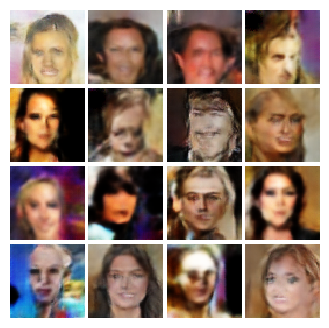


EPOCH:  21
EPOCH:  22
Iter: 8000, D: 0.08017, G:0.4639


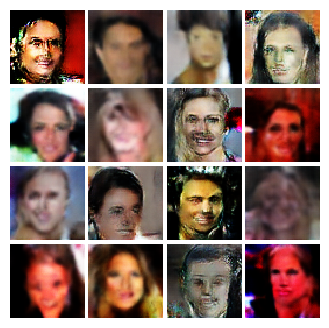


EPOCH:  23
EPOCH:  24
EPOCH:  25
Iter: 9000, D: 0.02379, G:0.4604


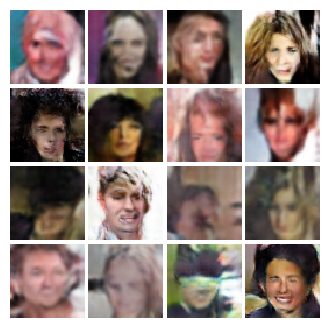


EPOCH:  26
EPOCH:  27
EPOCH:  28
Iter: 10000, D: 0.01789, G:0.5371


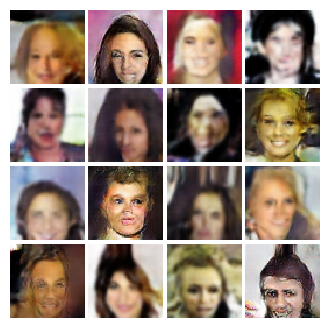


EPOCH:  29
EPOCH:  30


In [ ]:
# ls-gan
train(D, G, D_optimizer, G_optimizer, ls_discriminator_loss, 
          ls_generator_loss, num_epochs=30, show_every=1000,
          batch_size=batch_size, train_loader=faces_loader_train, device=device)